# FIT5226 Stage 3
### Name: Jee Eun Kim / Student ID: 34207147

---
### 0. Contract
![output.png](https://i.imgur.com/Y0nE4Ls.png)

---
### 1. Introduction
In this stage, the grid world environment from Stage 2 has been extended using **Multi-Agent** instead of Single Agent. Two different types of agents (two agents per type, a total of four agents) are introduced. Each agent starts with only half of a secret, and they must learn to exchange secrets and cooperate in order to reach the target location. Both agents and the target position are randomly placed within a 5x5 grid, ensuring that no agent starts on the target. To learn the full target position, agents of different types must meet and exchange secrets. The episode ends when one of the agents with the full secret reaches the target location.

The implemented code includes the following components:
1. **DQN class**
2. **Environment class**
3. **Agent class**
4. **SharedReplayBuffer class**
5. **Trainer class**
6. **Animation**: AnimeAgent class, MoveHistory class, create_agent_movement_animation function
7. **Tester class**

**Purchased items:**
1. Item no.4: Closest agent of opposite type (location)
2. Item no.5: Central clock

---

### 2. Environment Setup

- **Grid Size (n):** The grid is initialized to a 5x5 size.
- **Agents' Position and Target Position:** Each agent and the target are randomly assigned positions within the grid, ensuring no overlaps.
- **Central Clock Option:** 
1) Before any secret exchange occurs, agents with the shortest optimal_length within each type alternately take actions.
2) After the secret exchange, regardless of agent type, the agent with the shortest optimal_length takes action."

---

### 3. Agent Setup

The agents are divided into two types. Each type shares a **DQN network** and **replay buffer**, but they act individually.

- **Agent IDs 0, 1:** Type 1, uses `dqn1` and `replaybuffer1`.
- **Agent IDs 2, 3:** Type 2, uses `dqn2` and `replaybuffer2`.
- **Action Space:** There are five possible actions: `'n', 's', 'e', 'w', 'wait'`.

---

### 4. Training Phase

- **State Space:** The state space is composed of `n * n * 3 + 1` elements, where:
  - `n * n`: Agent’s position.
  - `n * n`: Target’s position.
  - `n * n`: The closest opposite-type agent’s position.
  - `1`: Whether the agent possesses the full secret.

  For a 5x5 grid, this results in a state space of 76 elements.

- The step count for each agent type was tracked, and the Q-network was trained every 3 steps per type. The target network was updated every 500 steps(`update_frequency`).

---

### 5. Reward Structure
![output.png](https://postfiles.pstatic.net/MjAyNDAzMDhfMTM2/MDAxNzA5ODg1NTg4MjUw.MsCIsXhHsyBRBiSXp-O7HW9XAAynEsduOS8sNsxk7dIg.jnIW4BoNAnjmQGUq54yWQd9XcYDVUA8zaHbzgCoI7K8g.PNG/%EC%8A%A4%ED%81%AC%EB%A6%B0%EC%83%B7_2024-03-08_170631.png?type=w773)
- When calculating the loss, the Q-values for target and action values are approximately at the first decimal place, so excessively large reward (r) values could hinder effective learning. Therefore, the r values are set between -1 and 1.
1) Reaching the target location with a full secret : +1
2) Successful secret exchange : +0.5
3) General Penalty(every step including 'wait') : -1

---
### 6. Conclusion

- **Figure 1** illustrates the performance of agents after training over 20,000 episodes. Examining the **reward** plot reveals an upward trend in reward values as episodes progress. This indicates that the agents are learning through interactions with the environment, gradually improving their policies. The downward trend in **loss** values suggests that the model is converging towards the minimum of the objective function, signifying successful policy evaluation and updating in the agents’ learning process. Additionally, while the **step** count shows variability initially, it gradually decreases over episodes. This indicates that the agents require fewer steps to reach the target or complete the given task, reflecting an evolution in the exploration-exploitation balance towards optimality. Such changes highlight the nature of multi-agent systems, where individual agents improve decision-making through cooperation or competition.

- Figure 1

![output.png](https://i.imgur.com/qsXYRjF.png)

- **Performance** 
1) (training) Performance Evaluation from Episode 1 ~ Episode 50000: Success Rate: 91.37%,	Optimal Path Diff: 9.0996,	Current Score: 2
2) (testing) Performance Evaluation from Test Episode 1 ~ Episode 1000: Success Rate: 52.60%, Optimal Path Diff: 14.5236, Current Score: 0

`C = 2+1 =3 (costs)`

`B = 2(training) / B' = 0(testing)`

`alpha = 0.835(training) / alpha' = 0.505(testing)`




In [2]:
C = 3 
B = 2
alpha = 1-33*max(0,C-B)/200
print(alpha)

0.835


### < DQN, Environment, Agent, ReplayBuffer, Trainer, Animation classes and execute training >

Episode: 1,	Reward: -113,	Type1 Reward: -107,	Type2 Reward: -6,	Steps: 84,	Avg Loss: 0.0000,	Done: True,	Epsilon: Type1 1.0000,	Type2 1.0000
Episode: 2,	Reward: -72,	Type1 Reward: -32,	Type2 Reward: -40,	Steps: 57,	Avg Loss: 0.0000,	Done: True,	Epsilon: Type1 0.9990,	Type2 0.9990
Episode: 3,	Reward: -105,	Type1 Reward: -72,	Type2 Reward: -33,	Steps: 87,	Avg Loss: 0.3047,	Done: True,	Epsilon: Type1 0.9980,	Type2 0.9980
Episode: 4,	Reward: -47,	Type1 Reward: -31,	Type2 Reward: -16,	Steps: 38,	Avg Loss: 0.2127,	Done: True,	Epsilon: Type1 0.9970,	Type2 0.9970
Episode: 5,	Reward: -35,	Type1 Reward: -25,	Type2 Reward: -10,	Steps: 31,	Avg Loss: 0.1372,	Done: True,	Epsilon: Type1 0.9960,	Type2 0.9960
Episode: 6,	Reward: -22,	Type1 Reward: -12,	Type2 Reward: -10,	Steps: 22,	Avg Loss: 0.0977,	Done: True,	Epsilon: Type1 0.9950,	Type2 0.9950
Episode: 7,	Reward: -15,	Type1 Reward: -12,	Type2 Reward: -3,	Steps: 14,	Avg Loss: 0.0898,	Done: True,	Epsilon: Type1 0.9940,	Type2 0.9940
Episode: 8,	Reward:

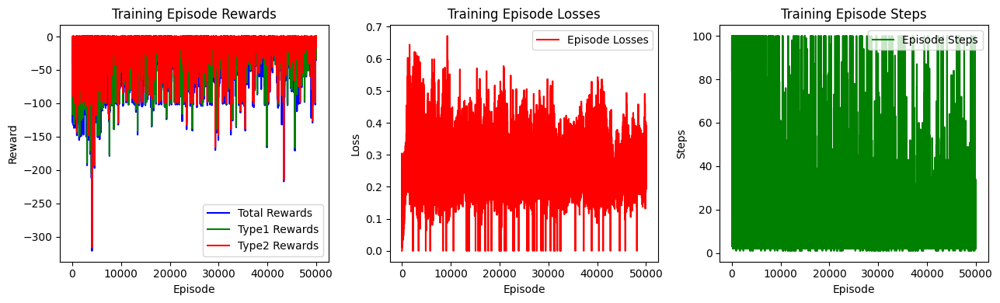

In [5]:
import torch
import copy
import random
import numpy as np
from collections import deque
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display

random.seed(1)

class DQN:
    def __init__(self, state_size,action_size = 5): 
        l1 = state_size
        l2 = 40
        #l3 = 24                                        #Use only one hidden layer
        l4 = action_size
        self.model = torch.nn.Sequential(
        torch.nn.Linear(l1, l2),
        # torch.nn.ReLU(),
        torch.nn.LeakyReLU(),
        # torch.nn.Linear(l2, l3),
        torch.nn.Linear(l2, l4)
        # torch.nn.ReLU(),
        # torch.nn.LeakyReLU(),
        # torch.nn.Linear(l3,l4))
        )
        
        # Xavier initialization for each layer's weights
        for layer in self.model:
            if isinstance(layer, torch.nn.Linear):
                torch.nn.init.xavier_uniform_(layer.weight)

        self.model2 = copy.deepcopy(self.model)
        self.model2.load_state_dict(self.model.state_dict())
        #self.loss_fn = torch.nn.MSELoss()
        self.loss_fn = torch.nn.SmoothL1Loss()
        self.learning_rate = 0.001
        self.optimizer = torch.optim.AdamW(self.model.parameters(), lr=self.learning_rate)

# The function "update_target" copies the state of the prediction network to the target network. You need to use this in regular intervals.
    def update_target(self):
        self.model2.load_state_dict(self.model.state_dict())

# The function "get_qvals" returns a numpy list of qvals for the state given by the argument based on the prediction network.
    def get_qvals(self, state):
        state = torch.from_numpy(state).float().unsqueeze(0)
        #print("State shape:", state.shape) 
        q_values = self.model(state)
        return q_values


    def get_maxQ(self,s):
        with torch.no_grad():
            return torch.max(self.model2(torch.from_numpy(s).float())).item()

# The function "train_one_step_new" performs a single training step.
# It returns the current loss (only needed for debugging purposes).
# Its parameters are three parallel lists: a minibatch of states, a minibatch of actions,
# a minibatch of the corresponding TD targets and the discount factor.
    def train_one_step(self, states, actions, targets):
        # Print the inputs for debugging
        # print("Training States:", states)
        # print("Actions:", actions)
        # print("Targets (TD Targets):", targets)
        # print("States batch shape:", np.array(states).shape)
        # print("Actions batch shape:", np.array(actions).shape)
        # print("Targets (TD Targets) shape:", np.array(targets).shape)


        # Convert data to torch tensors
        state1_batch = torch.from_numpy(np.array(states)).float()
        action_batch = torch.tensor(actions)
        Q1 = self.model(state1_batch)  
        X = Q1.gather(dim=1, index=action_batch.long().unsqueeze(dim=1)).squeeze()
        Y = torch.tensor(targets).float()  

        # Print Q-values and target values
        # print("Predicted Q-values:", X)
        # print("Target Q-values:", Y)
        # print("Predicted Q-values shape:", X.shape)
        # print("Target Q-values shape:", Y.shape)

        loss = self.loss_fn(X, Y)
        # print("Calculated Loss:", loss.item())
        # print("Loss shape:", loss.shape)

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        return loss.item()

    

class Environment:
    def __init__(self, size=5, central_clock=True, action_size=5, dqn_type1=None, dqn_type2=None, buffer_size=1000):
        self.size = size
        self.central_clock = central_clock
        self.current_turn = 0
        self.target_loc = None
        self.optimal_path_lengths = None
        self.action_size = action_size
        self.current_agent_index = 0 

        # DQN networks and buffers for different agent types
        self.type1_dqn = dqn_type1
        self.type2_dqn = dqn_type2
        self.type1_buffer = SharedReplayBuffer(buffer_size)
        self.type2_buffer = SharedReplayBuffer(buffer_size)

        self.reset()

    def reset(self):
        # Set a random target location
        self.target_loc = self.random_position()

        # Create agents with different types, DQNs, and replay buffers
        self.agents = [
            Agent(agent_id=0, agent_type=1, action_size=self.action_size, dqn_model=self.type1_dqn, replay_buffer=self.type1_buffer),
            Agent(agent_id=1, agent_type=1, action_size=self.action_size, dqn_model=self.type1_dqn, replay_buffer=self.type1_buffer),
            Agent(agent_id=2, agent_type=2, action_size=self.action_size, dqn_model=self.type2_dqn, replay_buffer=self.type2_buffer),
            Agent(agent_id=3, agent_type=2, action_size=self.action_size, dqn_model=self.type2_dqn, replay_buffer=self.type2_buffer)
        ]
        # Initialize agent positions and states
        for agent in self.agents:
            agent.position = self.random_position()
            # Ensure agents are not placed on the target location
            while agent.position == self.target_loc:
                agent.position = self.random_position()
            # Initialize closest_opponent_pos
            agent.closest_opponent_pos = None
            
        # Calculate optimal path lengths for all agents
        self.optimal_path_lengths = [self.calculate_optimal_path(i) for i in range(len(self.agents))]
        
        # Calculate optimal path lengths for all agents
        return [self.get_state(i) for i in range(len(self.agents))]
        

    def random_position(self):
        return (random.randint(0, self.size - 1), random.randint(0, self.size - 1))
    
    def position_to_one_hot(self, position):
        # Calculate optimal path lengths for all agents
        one_hot = np.zeros(self.size * self.size, dtype=int)
        index = position[0] * self.size + position[1]
        one_hot[index] = 1
        return one_hot
    
    
    def get_state(self, agent_id):
        # Initialize the state vector
        state = np.zeros(self.size * self.size * 3 + 1, dtype=int)
        agent = self.agents[agent_id]
        
        # Agent's current position (one-hot encoded)
        agent_pos = self.position_to_one_hot(agent.position)
        state[:self.size * self.size] = agent_pos

        # Target location (one-hot encoded) - Only include if agent has full secret
        if agent.full_secret and agent.target_loc is not None:
            target_pos = self.position_to_one_hot(agent.target_loc)
            state[self.size * self.size:self.size * self.size * 2] = target_pos
        else:
            # If no full secret, leave target location as all zeros
            state[self.size * self.size:self.size * self.size * 2] = 0

        # Position of the closest agent of opposite type (one-hot encoded)
        if agent.closest_opponent_pos is not None:
            opp_pos = self.agents[agent.closest_opponent_pos].position  # Get position of closest opponent
            opp_pos_one_hot = self.position_to_one_hot(opp_pos)  # Convert to one-hot encoding
            state[self.size * self.size * 2:self.size * self.size * 3] = opp_pos_one_hot
        else:
            # If no closest opponent found, leave opponent position as all zeros
            state[self.size * self.size * 2:self.size * self.size * 3] = 0

        # Whether the current agent has the full secret (binary)
        state[-1] = int(agent.full_secret)
        
        return state


    def manhattan_distance(self, pos1, pos2):
        return abs(pos1[0] - pos2[0]) + abs(pos1[1] - pos2[1])

    def find_closest_opposite(self, agent_id):
        # Find the closest agent of opposite type
        agent = self.agents[agent_id]
        # Create a list of agents that have a different type than the current agent
        opposite_agents = [i for i, a in enumerate(self.agents) if a.type != agent.type]
        # If no agents of the opposite type are found, return None
        if not opposite_agents:
            return None
        # Calculate the Manhattan distance between the current agent and all opposite-type agents
        distances = [self.manhattan_distance(agent.position, self.agents[i].position) for i in opposite_agents]
        # Find the minimum distance among all opposite-type agents
        min_distance = min(distances)
        # Collect all agents that are at the minimum distance
        closest_agents = [i for i, d in zip(opposite_agents, distances) if d == min_distance]
        # Randomly select one of the closest agents (in case multiple agents are at the same minimum distance)
        if len(closest_agents) > 0:
            return closest_agents[0]
        return None
    
    def step(self, agent_id, action):
        """
        Function that takes agent_id and action as arguments, performs the action for the agent,
        and returns the new state, reward, and whether the episode is done.
        """
        agent = self.agents[agent_id]
        # state = self.get_state(agent_id)
        #print(f"Current position before move: {agent.position}")

        # Update agent's position based on the chosen action
        agent.position = self.move(agent.position, action)
        #print(f"Updated position after move: {agent.position}")
        
        # Check for secret exchange
        self.check_secret_exchange(agent_id)

        # Find the closest agent of opposite type
        closest_opposite = self.find_closest_opposite(agent_id)
        if closest_opposite is not None:
            agent.closest_opponent_pos = closest_opposite

        # Calculate reward 
        reward = self.calculate_reward(agent_id)
        
        # Check termination condition (reaching target location with full secret)
        done = agent.position == self.target_loc and agent.full_secret 
        
        # Get the new state
        next_state = self.get_state(agent_id)
    
        return next_state, reward, done

    def move(self, position, action):
        x, y = position
        if action == 0:  # down
            y = max(0, y - 1)
        elif action == 1:  # up
            y = min(self.size - 1, y + 1)
        elif action == 2:  # left
            x = max(0, x - 1)
        elif action == 3:  # right
            x = min(self.size - 1, x + 1)
        elif action == 4:  # wait
            pass  
        return (x, y)

    def check_secret_exchange(self, agent_id):
        agent = self.agents[agent_id]
        exchange_occurred = False

        for other_agent in self.agents:
            # Check if the other agent is of opposite type, at the same position,
            # and at least one of them doesn't have the full secret
            if (other_agent.type != agent.type and 
                other_agent.position == agent.position and
                not (agent.full_secret and other_agent.full_secret)):
                
                # Secret exchange occurs
                agent.full_secret = True
                other_agent.full_secret = True

                # Inform both agents of the target location
                agent.target_loc = self.target_loc
                other_agent.target_loc = self.target_loc

                exchange_occurred = True

            
                # print(f"Agent {agent_id} (type {agent.type}) exchanged secrets with "
                #     f"Agent {self.agents.index(other_agent)} (type {other_agent.type}) "
                #     f"at position {agent.position}")
                # print(f"Original target location: {self.target_loc}")
                # print(f"Agent {agent_id}'s new target location: {agent.target_loc}")
                # print(f"Agent {self.agents.index(other_agent)}'s new target location: {other_agent.target_loc}")

        return exchange_occurred

    def calculate_reward(self, agent_id):
        agent = self.agents[agent_id]
        new_position = agent.position
        reward = -1

        # Reward for reaching the target location
        if new_position == self.target_loc and agent.full_secret:
            # Reached target with full secret
            return 1
        
        # Reward for secret exchange
        for other_agent in self.agents:
            if other_agent.type != agent.type and other_agent.position == new_position:
                if not agent.full_secret or not other_agent.full_secret:
                    reward += 0.5  # Successful secret exchange
        

        return reward
    
    def calculate_optimal_path(self, agent_id):
        """
        Calculate the optimal (minimum) path for an agent. If the agent doesn't have the full secret,
        they first move to the nearest opposite type agent to exchange secrets. If they already have
        the full secret, they go directly to the target location.
        """
        agent = self.agents[agent_id]
        agent_pos = agent.position

        # 1. Calculate the distance to the nearest opposite agent only if the agent does not have the full secret
        if not agent.full_secret:
            closest_opposite_index = self.find_closest_opposite(agent_id)
            closest_opposite_pos = self.agents[closest_opposite_index].position
            distance_to_opposite = self.manhattan_distance(agent_pos, closest_opposite_pos)
            # Update agent position to the closest opposite agent's position after exchange
            agent_pos = closest_opposite_pos
        else:
            # If the agent has the full secret, no need to go to an opposite type agent
            distance_to_opposite = 0

        # 2. Calculate the distance from the updated position to the target location
        distance_to_goal = self.manhattan_distance(agent_pos, self.target_loc)

        # Optimal path is the path to the opposite agent (if needed) + path to the goal
        optimal_path_length = distance_to_opposite + distance_to_goal

        return optimal_path_length



class Agent:
    def __init__(self, agent_id, agent_type, action_size, dqn_model, replay_buffer):
        self.id = agent_id
        self.type = agent_type  # Agent type (1 or 2)
        self.action_size = action_size  # Number of possible actions
        self.dqn = dqn_model  # DQN model assigned to the agent
        self.replay_buffer = replay_buffer  # Replay buffer for storing experiences
        self.position = None   # Agent's current position
        self.full_secret = False   # Indicates whether the agent has exchanged the full secret
        self.target_loc = None  # Target location for the agent
        self.closest_opponent_pos = None  # Position of the nearest opponent agent

    def select_action(self, state, epsilon):
        
        #if np.random.rand() < epsilon:s
        if random.random() < epsilon:
            # Select a random action (exploration)
            return random.randint(0, self.action_size - 1)
        else:
            # Select the best action based on the DQN network (exploitation)
            q_values = self.dqn.get_qvals(state)  # Get Q-values from the DQN model
            return torch.argmax(q_values).item()  # Return the index of the maximum Q-value -> action


class SharedReplayBuffer:
    def __init__(self, capacity):
        self.buffer = deque(maxlen=capacity)
    
    def add(self, state, action, reward, next_state, done):
        # Add data to replay buffer and print the added experience
        # print(f"Adding to buffer: state={state}, action={action}, reward={reward}, next_state={next_state}, done={done}")
        self.buffer.append((state, action, reward, next_state, done))
    
    def sample(self, batch_size):
        batch = random.sample(self.buffer, batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)
        
        return (np.array(states),
                np.array(actions),
                np.array(rewards, dtype=np.float32),
                np.array(next_states),
                np.array(dones, dtype=bool))
    def __len__(self):
        return len(self.buffer)


    
class Trainer:
    def __init__(self, environment: Environment, batch_size=64, gamma=0.99, update_frequency=500, max_episodes=50000, max_steps=100, epsilon_decay=0.999, epsilon_min=0.1):
        self.environment = environment
        self.batch_size = batch_size
        self.gamma = gamma
        self.update_frequency = update_frequency
        self.max_episodes = max_episodes
        self.max_steps = max_steps
        self.epsilon_type1 = 1.0  
        self.epsilon_type2 = 1.0  
        self.epsilon_min = epsilon_min
        self.epsilon_decay = epsilon_decay
        self.step_counter_type1 = 0
        self.step_counter_type2 = 0
        self.episode_rewards = []  # Total reward for each episode
        self.episode_steps = []
        self.episode_losses = []
        self.success_rates = []
        self.optimal_path_diffs = []
        self.scores = []
        self.episode_epochs = []
        self.done_list = [] 
        self.ep_history = []
        

        # Add variables for tracking rewards by agent type
        self.type1_rewards = []  # To store rewards for type 1 agents
        self.type2_rewards = []  # To store rewards for type 2 agents

    def train(self):
        epochs = 0
        
        for episode in range(1, self.max_episodes + 1):  # Start episode from 1
            self.environment.reset()  # Reset environment
            total_reward = 0
            type1_reward = 0  # Track reward for type 1 agents
            type2_reward = 0  # Track reward for type 2 agents
            steps = 0
            done = False
            episode_losses = []
            history = []
            episode_optimal_path_diffs = []

            # Calculate the minimum optimal path length for this episode
            episode_optimal_path = min(self.environment.optimal_path_lengths)

            # Record the initial positions of agents (after reset) for animation
            for agent_id, agent in enumerate(self.environment.agents):
                history.append(MoveHistory(agent_id, agent.position, full_secret=agent.full_secret))

            current_type = 1 # Start with type 1 agents
            while not done and steps < self.max_steps:
                # Check if any agent has full_secret
                full_secret_agents = [agent for agent in self.environment.agents if agent.full_secret]

                if full_secret_agents:
                    # If there are agents with full_secret, only select from those agents
                    optimal_agents = sorted(full_secret_agents , key=lambda ag: self.environment.calculate_optimal_path(ag.id))
                else:
                    # Otherwise, continue alternating between agent types
                    # Calculate optimal path lengths for each agent and sort by ascending path length
                    pool = list(filter(lambda i: i.type == current_type, self.environment.agents))
                    optimal_agents = sorted(pool, key=lambda ag: self.environment.calculate_optimal_path(ag.id))

                    current_type = 2 if current_type == 1 else 1  # Switch between agent types

                # Move only the agent with the smallest optimal path
                agent = optimal_agents[0]  # Select the agent with the shortest optimal path
                agent_id = agent.id
                state = self.environment.get_state(agent_id)
                epsilon = self.epsilon_type1 if agent.type == 1 else self.epsilon_type2
                action = agent.select_action(state, epsilon)
                next_state, reward, done = self.environment.step(agent_id, action)
                history.append(MoveHistory(agent_id, agent.position, full_secret=agent.full_secret))

                # Accumulate rewards for each type of agent
                if agent.type == 1:
                    type1_reward += reward
                    self.step_counter_type1 += 1  # Increment type 1's step counter
                else:
                    type2_reward += reward
                    self.step_counter_type2 += 1  # Increment type 2's step counter

                total_reward += reward  # Total reward for all agents

                if action != 4:  # Count steps only if action is not 'wait'
                    steps += 1

                # Add experience to the replay buffer
                agent.replay_buffer.add(state, action, reward, next_state, done)

                # Update Q networks every 4 steps
                if agent.type == 1 and self.step_counter_type1 % 2 == 0 and len(agent.replay_buffer) >= self.batch_size:
                    loss = self.train_step(agent)
                    episode_losses.append(loss)
                    epochs += 1
                elif agent.type == 2 and self.step_counter_type2 % 2 == 0 and len(agent.replay_buffer) >= self.batch_size:
                    loss = self.train_step(agent)
                    episode_losses.append(loss)
                    epochs += 1

                # Update target networks every 500 steps
                if self.step_counter_type1 % self.update_frequency == 0:
                    self.environment.type1_dqn.update_target()
                if self.step_counter_type2 % self.update_frequency == 0:
                    self.environment.type2_dqn.update_target()

                # End the loop if the maximum steps are reached
                if steps >= self.max_steps:
                    break

                # End the loop if the agent has reached the target location
                if done:
                    break

            # Record the done status and episode history
            self.done_list.append(done)
            self.ep_history.append((history, self.environment.target_loc))

            # Log episode results
            self.episode_rewards.append(total_reward)
            self.type1_rewards.append(type1_reward)
            self.type2_rewards.append(type2_reward)
            self.episode_steps.append(steps)
            avg_loss = sum(episode_losses) / len(episode_losses) if episode_losses else 0
            self.episode_losses.append(avg_loss)

            # Calculate the difference between actual steps and optimal path length
            optimal_path_diff = steps - episode_optimal_path
            episode_optimal_path_diffs.append(optimal_path_diff)

            # Print episode results
            print(f"Episode: {episode},\tReward: {total_reward},\tType1 Reward: {type1_reward},\tType2 Reward: {type2_reward},\t"
              f"Steps: {steps},\tOptimal Path: {episode_optimal_path},\tOptimal Path Diff: {optimal_path_diff},\t"
              f"Avg Loss: {avg_loss:.4f},\tDone: {done},\t"
              f"Epsilon: Type1 {self.epsilon_type1:.4f},\tType2 {self.epsilon_type2:.4f}")

            # Decrease exploration rate (epsilon decay)
            self.update_epsilon()

            # Performance evaluation and success rate calculation every 10 episodes
            if episode % 10 == 0:
                success_rate = self.calculate_success_rate(episode)
                self.success_rates.append(success_rate)
                avg_optimal_path_diff = self.calculate_optimal_path_diff()
                

                # Calculate performance score
                score = self.calculate_scores(success_rate, avg_optimal_path_diff, episode)
                print("*" * 50)
                print(f"Performance Evaluation from Episode 1 ~ Episode {episode}: Success Rate: {success_rate:.2f}%,\t"
                    f"Avg Optimal Path Diff: {avg_optimal_path_diff:.4f},\tCurrent Score: {score},\tepochs: {epochs}")
                print("*" * 50)

        self.save_models()
        #self.report()
        self.plot_train_results()


    def train_step(self, agent):
        # batch sampling from buffer
        states, actions, rewards, next_states, dones = agent.replay_buffer.sample(self.batch_size)
        # Initialize a list to store TD targets
        td_targets = []
        for i in range(self.batch_size):
            # Calculate the maximum Q-value for the next state
            best_future_value = agent.dqn.get_maxQ(next_states[i])
            # Calculate the TD target for the current sample
            td_target = rewards[i] + self.gamma * best_future_value * (1 - float(dones[i]))
            # Append TD target to the list
            td_targets.append(td_target)

        # Perform a training step on the DQN with the computed TD targets
        loss = agent.dqn.train_one_step(states, actions, td_targets)
        
        return loss


    def update_epsilon(self):
        # Reduce exploration rate (epsilon) for each agent type, ensuring it does not fall below epsilon_min
        if self.epsilon_type1 > self.epsilon_min:
            self.epsilon_type1 *= self.epsilon_decay
        if self.epsilon_type2 > self.epsilon_min:
            self.epsilon_type2 *= self.epsilon_decay

    def calculate_success_rate(self, episode):
        # Calculate the success rate based on agents reaching the target within 15 steps
        success_count = 0
        for i in range(1, episode + 1):
            if self.episode_steps[i - 1] <= 15:  
                success_count += 1
        success_rate = (success_count / episode) * 100
        return success_rate

    def calculate_optimal_path_diff(self):
        # Calculate average optimal path difference for completed episodes
        completed_diffs = [self.episode_optimal_path_diffs[i] for i in range(len(self.done_list)) if self.done_list[i]]
        
        if not completed_diffs:  # No completed episodes yet
            return 0
        
        return sum(completed_diffs) / len(completed_diffs)  # Average difference for completed episodes only

    
       
    # def calculate_optimal_path_diff(self):
    #     # Calculate the difference between the optimal path and the actual path for agents
    #     path_diffs = []
    #     done_count = 0 # Count the number of completed episodes (where 'done' is True)

    #     for episode in range(len(self.episode_steps)):
    #         # Count the number of completed episodes (where 'done' is True)
    #         if self.done_list[episode]:
    #             done_count += 1
    #             # Compute the optimal path length for the agent 
    #             optimal_path = self.environment.calculate_optimal_path(agent_id=0)  
    #             actual_path = self.episode_steps[episode]
    #             optimal_path_diff = actual_path - optimal_path
    #             path_diffs.append(optimal_path_diff)

    #     if done_count == 0:
    #         return 0  # No done episodes yet

    #     return sum(path_diffs) / done_count # Average difference between optimal and actual path

    def calculate_scores(self, success_rate, optimal_path_diff, episode):
         # Assign a performance score based on success rate and path differences
        score = 0

        # Assign score based on success rate
        if success_rate >= 98:
            score += 2
        elif success_rate >= 85:
            score += 1

        # Assign score based on number of episodes
        if success_rate >= 98 and episode <= 20000:
            score += 2
        elif success_rate >= 98 and episode <= 50000:
            score += 1
        elif success_rate >= 85 and episode <= 20000:
            score += 2
        elif success_rate >= 85 and episode <= 50000:
            score += 1

        # Assign score based on optimal path difference
        if optimal_path_diff <= 0.5:
            score += 2
        elif optimal_path_diff <= 2.5:
            score += 1
            
        

        return score  # Return the calculated performance score

    def report(self):
        # Generate a summary report of the training performance across episodes
        if len(self.episode_rewards) > 0:
            total_rewards = sum(self.episode_rewards) / len(self.episode_rewards)
        else:
            total_rewards = 0
        
        if len(self.episode_steps) > 0:
            total_steps = sum(self.episode_steps) / len(self.episode_steps)
        else:
            total_steps = 0

        if len(self.episode_losses) > 0:
            avg_loss = sum(self.episode_losses) / len(self.episode_losses)
        else:
            avg_loss = 0

        if len(self.success_rates) > 0:
            avg_success_rate = sum(self.success_rates) / len(self.success_rates)
        else:
            avg_success_rate = 0

        if len(self.optimal_path_diffs) > 0:
            avg_optimal_path_diff = sum(self.optimal_path_diffs) / len(self.optimal_path_diffs)
        else:
            avg_optimal_path_diff = 0

        print("-" * 50)
        print(f"Average Reward: {total_rewards}, Average Steps: {total_steps}, "
            f"Average Loss: {avg_loss:.4f}, Average Success Rate: {avg_success_rate:.2f}%, "
            f"Average Optimal Path Difference: {avg_optimal_path_diff}")
        print("-" * 50)


    def save_models(self):
        # Save the models for Type1 and Type2 agents' DQN networks
        torch.save(self.environment.type1_dqn.model.state_dict(), 'dqn_type1_model.pth')
        torch.save(self.environment.type2_dqn.model.state_dict(), 'dqn_type2_model.pth')

    def plot_train_results(self):
        """Plots the training results (Rewards, Losses, Steps)"""
        episodes = list(range(1, len(self.episode_rewards) + 1))

        fig, ax = plt.subplots(1,3, figsize=(13,4))

        # First plot: Episode rewards
        ax[0].plot(episodes, self.episode_rewards, label='Total Rewards', color='blue')
        ax[0].plot(episodes, self.type1_rewards, label='Type1 Rewards', color='green')
        ax[0].plot(episodes, self.type2_rewards, label='Type2 Rewards', color='red')
        ax[0].set_xlabel('Episode')
        ax[0].set_ylabel('Reward')
        ax[0].set_title('Training Episode Rewards')
        ax[0].legend()


        # Second plot: Episode losses
        ax[1].plot(episodes, self.episode_losses, label='Episode Losses', color='red')
        ax[1].set_xlabel('Episode')
        ax[1].set_ylabel('Loss')
        ax[1].set_title('Training Episode Losses')
        ax[1].legend()

        # Third plot: Episode steps
        ax[2].plot(episodes, self.episode_steps, label='Episode Steps', color='green')
        ax[2].set_xlabel('Episode')
        ax[2].set_ylabel('Steps')
        ax[2].set_title('Training Episode Steps')
        ax[2].legend()

        plt.tight_layout()

        plt.show()



class AnimeAgent:
   def __init__(self, agent_index: int, agent_type: int, location, full_secret=False) -> None:
      self.agent_index = agent_index  # Agent index
      self.agent_type = agent_type # Agent type
      self.location = location # Agent's current location
      self.full_secret = full_secret # Whether the agent has exchanged secrets (has full secret)



class MoveHistory:
   def __init__(self, index: int, new_location, full_secret=False) -> None:
      self.agent_index = index # Agent index
      self.new_location = new_location  # New location after moving
      self.full_secret = full_secret  # Whether the agent has exchanged secrets (has full secret)

def create_agent_movement_animation(environment: Environment, ep_histroy):
    fig, ax = plt.subplots(figsize=(10, 10))

    move_history = ep_histroy[0]     # Movement history
    target_location = ep_histroy[1]  # Target location

    starting_locations = move_history[:len(environment.agents)]
    move_history = move_history[len(environment.agents):] # Remaining history for movement

    # Initialize AnimeAgent instances (store initial locations of agents)
    current_agents = []

    for current in starting_locations:
        current_agents.append(AnimeAgent(
            agent_index=current.agent_index, 
            agent_type=environment.agents[current.agent_index].type, 
            location=current.new_location
        ))

    def animate(frame):
        ax.clear()
        ax.set_xlim(0, environment.size)
        ax.set_ylim(0, environment.size)
        ax.set_xticks(range(environment.size + 1))
        ax.set_yticks(range(environment.size + 1))
        ax.grid(True)

        # Draw the target location
        ax.add_patch(patches.Rectangle(target_location, 1, 1, color='green', label='Target Location'))

        # Update agent's movement for the current frame
        current = move_history[frame]
        current_agents[current.agent_index].location = current.new_location
        current_agents[current.agent_index].full_secret = current.full_secret

        # Draw agents' positions
        for agent in current_agents:
            ax.add_patch(patches.Rectangle(agent.location, 1, 1, color='blue' if agent.agent_type == 1 else 'red', label=f'Agent Type {agent.agent_type}'))

            # Draw a circle around agents who have exchanged secrets (have full secret)
            if agent.full_secret:
                circle = plt.Circle((agent.location[0] + 0.5, agent.location[1] + 0.5), 0.3, color='yellow', fill=False, linewidth=2)
                ax.add_patch(circle)

        # Add the legend
        handles, labels = ax.get_legend_handles_labels()
        by_label = dict(zip(labels, handles))
        yellow_circle = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='yellow', markersize=10, label='Has Full Secret')
        by_label['Has Full Secret'] = yellow_circle

        ax.legend(by_label.values(), by_label.keys(), loc='upper right')

        return ax.patches

    # Create the animation
    anim = FuncAnimation(fig, animate, frames=len(move_history), interval=200, blit=False, repeat=False)
    return anim
   










# Example usage for training

# 1. Set hyperparameters
state_size = 5 * 5 * 3 + 1  # State size for the agent (grid size 5x5, with 3 channels and 1 additional state)
action_size = 5  # Number of possible actions (up, down, left, right, wait)
buffer_size = 1000 
batch_size = 200
gamma = 0.99
update_frequency = 1000 # How often to update the target network
max_episodes = 50000

# 2. Create DQN models for different agent types
dqn_type1 = DQN(state_size, action_size) # DQN for agent type 1
dqn_type2 = DQN(state_size, action_size) # DQN for agent type 2

# 3. Create the Environment object
env = Environment(size=5, action_size=action_size, dqn_type1=dqn_type1, dqn_type2=dqn_type2, buffer_size=buffer_size)

# 4. Create the Trainer object for managing training
trainer = Trainer(environment=env, batch_size=batch_size, gamma=gamma, update_frequency=update_frequency, max_episodes=max_episodes)

# 5. Start training
trainer.train()


### < Execute animation for Training (Last episode) >

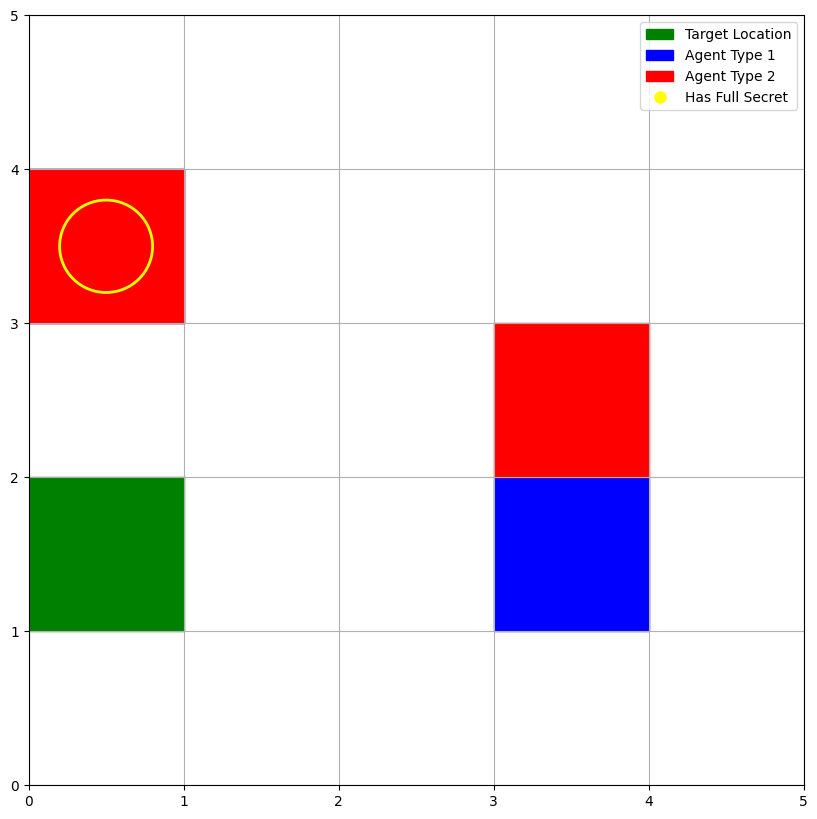

In [2]:
# for history in trainer.ep_history:
#     agent_animation = create_agent_movement_animation(env, history)
#     display(HTML(agent_animation.to_jshtml()))
#     break

# Create an animation for the last episode's movement (ep_history[i]: i = episode number)
agent_animation = create_agent_movement_animation(env, trainer.ep_history[-1])
# Display the animation in the notebook
display(HTML(agent_animation.to_jshtml()))



###  < Tester class and execute test >

Pre-trained models loaded successfully!
Test Episode: 1, Reward: -4, Type1 Reward: -2, Type2 Reward: -2, Steps: 5, Optimal Path: 4, Optimal Path Diff: 1, Done: True
Test Episode: 2, Reward: -3, Type1 Reward: -2, Type2 Reward: -1, Steps: 5, Optimal Path: 2, Optimal Path Diff: 3, Done: True
Test Episode: 3, Reward: -4, Type1 Reward: -2, Type2 Reward: -2, Steps: 6, Optimal Path: 6, Optimal Path Diff: 0, Done: True
Test Episode: 4, Reward: -8, Type1 Reward: -6, Type2 Reward: -2, Steps: 10, Optimal Path: 4, Optimal Path Diff: 6, Done: True
Test Episode: 5, Reward: -4, Type1 Reward: -2, Type2 Reward: -2, Steps: 6, Optimal Path: 3, Optimal Path Diff: 3, Done: True
Test Episode: 6, Reward: -5, Type1 Reward: -3, Type2 Reward: -2, Steps: 7, Optimal Path: 5, Optimal Path Diff: 2, Done: True
Test Episode: 7, Reward: -3, Type1 Reward: -2, Type2 Reward: -1, Steps: 5, Optimal Path: 5, Optimal Path Diff: 0, Done: True
Test Episode: 8, Reward: -6, Type1 Reward: -4, Type2 Reward: -2, Steps: 8, Optimal P

Test Episode: 33, Reward: -5, Type1 Reward: -4, Type2 Reward: -1, Steps: 6, Optimal Path: 6, Optimal Path Diff: 0, Done: True
Test Episode: 34, Reward: -1, Type1 Reward: -1, Type2 Reward: 0, Steps: 3, Optimal Path: 3, Optimal Path Diff: 0, Done: True
Test Episode: 35, Reward: -3, Type1 Reward: -1, Type2 Reward: -2, Steps: 5, Optimal Path: 5, Optimal Path Diff: 0, Done: True
Test Episode: 36, Reward: -6, Type1 Reward: -4, Type2 Reward: -2, Steps: 7, Optimal Path: 4, Optimal Path Diff: 3, Done: True
Test Episode: 37, Reward: -7, Type1 Reward: -5, Type2 Reward: -2, Steps: 9, Optimal Path: 4, Optimal Path Diff: 5, Done: True
Test Episode: 38, Reward: -5, Type1 Reward: -3, Type2 Reward: -2, Steps: 7, Optimal Path: 4, Optimal Path Diff: 3, Done: True
Test Episode: 39, Reward: -3, Type1 Reward: -1, Type2 Reward: -2, Steps: 5, Optimal Path: 4, Optimal Path Diff: 1, Done: True
Test Episode: 40, Reward: -2, Type1 Reward: -2, Type2 Reward: 0, Steps: 4, Optimal Path: 4, Optimal Path Diff: 0, Done:

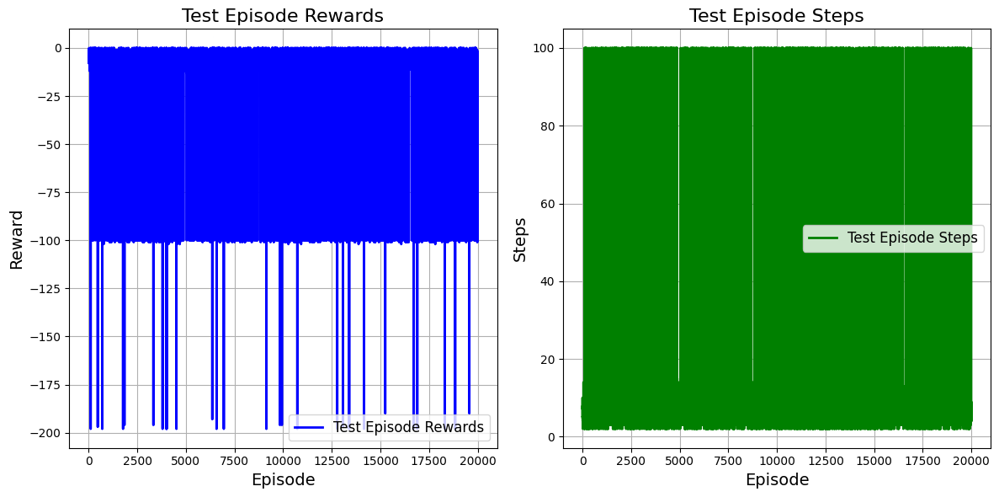

In [12]:
class Tester:
    def __init__(self, environment, dqn_type1_model_path, dqn_type2_model_path, batch_size=64, gamma=0.99, max_steps=100):
        self.environment = environment
        self.batch_size = batch_size
        self.gamma = gamma
        self.max_steps = max_steps
        self.episode_rewards = []
        self.episode_steps = []
        self.done_list = []
        self.ep_history = []
        self.episode_optimal_path_diffs=[]

        # Load the pre-trained DQN models
        self.load_models(dqn_type1_model_path, dqn_type2_model_path)

    def load_models(self, dqn_type1_model_path, dqn_type2_model_path):
        """
        Load the pre-trained Q-networks for both agent types.
        """
        self.environment.type1_dqn.model.load_state_dict(torch.load(dqn_type1_model_path))
        self.environment.type2_dqn.model.load_state_dict(torch.load(dqn_type2_model_path))
        print("Pre-trained models loaded successfully!")

    def test(self, test_episodes=10):
        for episode in range(1, test_episodes + 1):
            # Reset the environment for each episode
            self.environment.reset()
            total_reward = 0
            steps = 0
            done = False
            history = []
            type1_reward = 0  # Track reward for type 1 agents if needed
            type2_reward = 0  # Track reward for type 2 agents if needed
            episode_optimal_path = min(self.environment.optimal_path_lengths)
            
            # Record the initial positions of agents for animation
            for agent_id, agent in enumerate(self.environment.agents):
                history.append(MoveHistory(agent_id, agent.position, full_secret=agent.full_secret))
            current_type = 1 # Start with type 1 agents
            while not done and steps < self.max_steps:
                full_secret_agents = [agent for agent in self.environment.agents if agent.full_secret]
                if full_secret_agents:
                    optimal_agents = sorted(full_secret_agents, key=lambda ag: self.environment.calculate_optimal_path(ag.id))
                else:
                    pool = list(filter(lambda i: i.type == current_type, self.environment.agents))
                    optimal_agents = sorted(pool, key=lambda ag: self.environment.calculate_optimal_path(ag.id))
                    current_type = 2 if current_type == 1 else 1  # Switch between agent types

                # Move only the agent with the smallest optimal path
                agent = optimal_agents[0]
                agent_id = agent.id
                state = self.environment.get_state(agent_id)
                action = agent.select_action(state, epsilon=0)
                next_state, reward, done = self.environment.step(agent_id, action)
                history.append(MoveHistory(agent_id, agent.position, full_secret=agent.full_secret))

                # Accumulate rewards for each type of agent
                if agent.type == 1:
                    type1_reward += reward
                else:
                    type2_reward += reward
                
                total_reward += reward  # Total reward for all agents

                if action != 4:  # Increment steps only if action is not 'wait'
                    steps += 1
                if steps >= self.max_steps:
                    break
                if done:
                    break

            # Save the episode history
            self.ep_history.append((history, self.environment.target_loc))
            self.episode_rewards.append(total_reward)
            self.episode_steps.append(steps)
            self.done_list.append(done)

            optimal_path_diff = steps - episode_optimal_path
            self.episode_optimal_path_diffs.append(optimal_path_diff)

            print(f"Test Episode: {episode}, Reward: {total_reward}, Type1 Reward: {type1_reward}, Type2 Reward: {type2_reward}, "
                f"Steps: {steps}, Optimal Path: {episode_optimal_path}, Optimal Path Diff: {optimal_path_diff}, Done: {done}")

            # Performance evaluation and score calculation every 10 episodes
            if episode % 10 == 0:
                success_rate = self.calculate_success_rate(episode)
                avg_optimal_path_diff = self.calculate_optimal_path_diff()
                score = self.calculate_scores(success_rate, avg_optimal_path_diff, episode)

                # Print performance evaluation
                print("*" * 50)
                print(f"Performance Evaluation from Test Episode 1 ~ Episode {episode}: Success Rate: {success_rate:.2f}%, "
                    f"Avg Optimal Path Diff: {avg_optimal_path_diff:.4f}, Current Score: {score}")
                print("*" * 50)

        
        # Generate a test report and visualize the results
        #self.report()
        self.plot_test_results() 

    def calculate_success_rate(self, episode):
        # Calculate the success rate based on agents reaching the target within 15 steps
        success_count = sum(1 for i in range(episode) if self.episode_steps[i] <= 15)
        success_rate = (success_count / episode) * 100
        return success_rate

    def calculate_optimal_path_diff(self):
        # Calculate the difference between the optimal path and the actual path for agents
        path_diffs = [self.episode_steps[i] - self.environment.calculate_optimal_path(agent_id=0)
                      for i in range(len(self.episode_steps)) if self.done_list[i]]
        
        return sum(path_diffs) / len(path_diffs) if path_diffs else 0

    def calculate_scores(self, success_rate, optimal_path_diff, episode):
         # Assign a performance score based on success rate and path differences
        score = 0

        # Assign score based on success rate
        if success_rate >= 98:
            score += 2
        elif success_rate >= 85:
            score += 1

        # Assign score based on number of episodes
        if success_rate >= 98 and episode <= 20000:
            score += 2
        elif success_rate >= 98 and episode <= 50000:
            score += 1
        elif success_rate >= 85 and episode <= 20000:
            score += 2
        elif success_rate >= 85 and episode <= 50000:
            score += 1

        # Assign score based on optimal path difference
        if optimal_path_diff <= 0.5:
            score += 2
        elif optimal_path_diff <= 2.5:
            score += 1
            
        

        return score  # Return the calculated performance score
   
    def report(self):
        """
        Print a report summarizing the average results across all test episodes.
        """
        if len(self.episode_rewards) > 0:
            avg_reward = sum(self.episode_rewards) / len(self.episode_rewards)
        else:
            avg_reward = 0

        if len(self.episode_steps) > 0:
            avg_steps = sum(self.episode_steps) / len(self.episode_steps)
        else:
            avg_steps = 0

        if len(self.done_list) > 0:
            success_rate = sum(self.done_list) / len(self.done_list) * 100
        else:
            success_rate = 0

        print("-" * 50)
        print(f"Test Report: Average Reward: {avg_reward}, Average Steps: {avg_steps}, Success Rate: {success_rate:.2f}%")
        print("-" * 50)


    def plot_test_results(self):

        episodes = list(range(1, len(self.episode_rewards) + 1))

        fig, ax = plt.subplots(1, 2, figsize=(12, 6)) 

        # First plot: Test Episode Rewards
        ax[0].plot(episodes, self.episode_rewards, label='Test Episode Rewards', color='blue', linewidth=2)  
        ax[0].set_xlabel('Episode', fontsize=14)  
        ax[0].set_ylabel('Reward', fontsize=14)  
        ax[0].set_title('Test Episode Rewards', fontsize=16)  
        ax[0].legend(fontsize=12)  
        ax[0].grid(True)  

        # Second plot: Test Episode Steps
        ax[1].plot(episodes, self.episode_steps, label='Test Episode Steps', color='green', linewidth=2) 
        ax[1].set_xlabel('Episode', fontsize=14) 
        ax[1].set_ylabel('Steps', fontsize=14) 
        ax[1].set_title('Test Episode Steps', fontsize=16)  
        ax[1].legend(fontsize=12) 
        ax[1].grid(True)  

        plt.tight_layout()

        plt.show()


# Create a Tester object
tester = Tester(environment=env, dqn_type1_model_path='dqn_type1_model.pth', dqn_type2_model_path='dqn_type2_model.pth')

# Run the tests
tester.test(test_episodes=20000)

### < Execute animation for Test (First episode) >

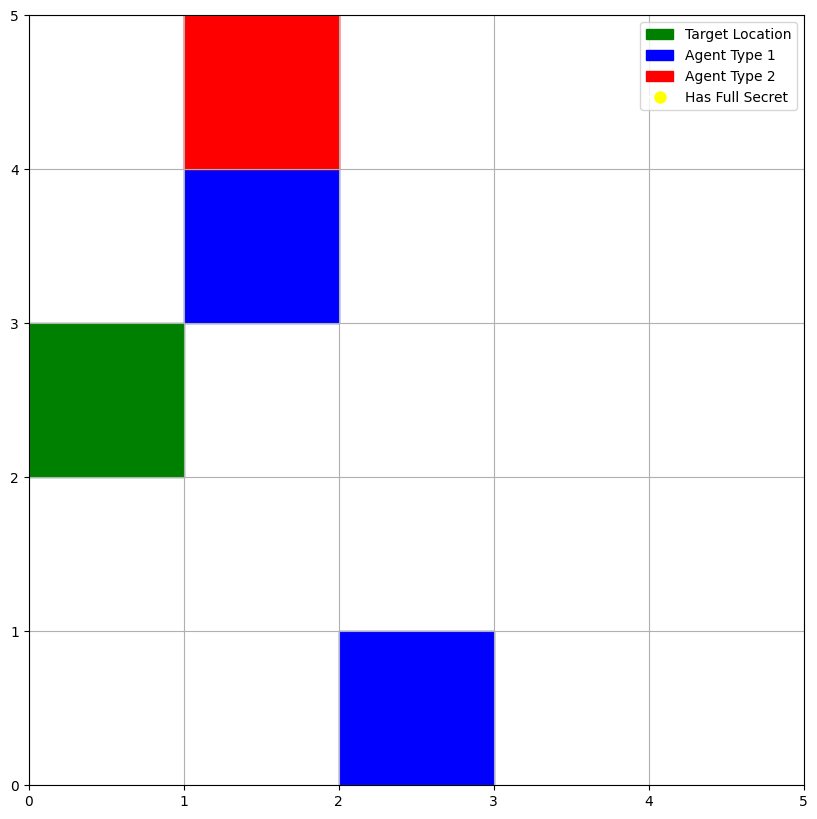

In [47]:
# Create an animation for the last episode's movement (ep_history[i]: i = episode number)
agent_animation = create_agent_movement_animation(env, tester.ep_history[1])
# Display the animation in the notebook
display(HTML(agent_animation.to_jshtml()))
